[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Denis-R-V/TSR/blob/main/main.ipynb)

# Система распознавания дорожных знаков на датасете RTSD

In [1]:
colab = False

if colab == True:
    from google.colab import drive
    drive.mount('/content/drive')
    !pip install kaggle
    !mkdir ~/.kaggle
    !cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
    !kaggle datasets download watchman/rtsd-dataset
    !unzip rtsd-dataset.zip
    !rm rtsd-dataset.zip
    !cp -r rtsd-frames/rtsd-frames/ .
    !rm -r rtsd-frames/rtsd-frames/
    !pip install fiftyone

if colab == True:
    dataset_path = '.'
else:
    dataset_path = 'data'

In [33]:
import os
import json
#import numpy as np 
import pandas as pd 

from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

from pycocotools.coco import COCO
import fiftyone as fo
#import time
#import torch
#import torchvision
#from torch.utils.data import Dataset, DataLoader
#import torchvision.transforms as transforms
#from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
#from torchvision.models.detection import FasterRCNN
#import cv2

# Анализ датасета

### train_anno.json

In [3]:
with open(os.path.join(dataset_path, 'train_anno.json'), 'r') as read_file:
    train_anno = json.load(read_file)
read_file.close()
train_anno.keys()

dict_keys(['images', 'annotations', 'categories'])

In [4]:
display(train_anno.get('images')[47])
display(len(train_anno.get('images')))
display(train_anno.get('annotations')[82])
display(len(train_anno.get('annotations')))
display(train_anno.get('categories')[10])
display(len(train_anno.get('categories')))

{'id': 51,
 'width': 1280,
 'height': 720,
 'file_name': 'rtsd-frames/autosave01_02_2012_09_16_49.jpg'}

54188

{'id': 88,
 'image_id': 51,
 'category_id': 11,
 'area': 1813,
 'bbox': [826, 277, 37, 49],
 'iscrowd': 0}

95492

{'id': 11, 'name': '7_15'}

155

*archive/train_anno.json* состоит из 3 списков:
- *images* содержит информацию о 54188 изображениях (метаданные - id, ширина, высота и путь к файлу);
- *annotations* содержит информацию о 95492 аннотациях (ограничивающие прямоугольники, классы объектов и т.д.);
- *categories* содержит информацию о 155 категориях классификации.  
Датасет представлен в формате Common Objects in Context (COCO)

### train_anno_reduced.json

In [31]:
train_anno.get('categories')

[{'id': 1, 'name': '2_1'},
 {'id': 2, 'name': '1_23'},
 {'id': 3, 'name': '1_17'},
 {'id': 4, 'name': '3_24'},
 {'id': 5, 'name': '8_2_1'},
 {'id': 6, 'name': '5_20'},
 {'id': 7, 'name': '5_19_1'},
 {'id': 8, 'name': '5_16'},
 {'id': 9, 'name': '3_25'},
 {'id': 10, 'name': '6_16'},
 {'id': 11, 'name': '7_15'},
 {'id': 12, 'name': '2_2'},
 {'id': 13, 'name': '2_4'},
 {'id': 14, 'name': '8_13_1'},
 {'id': 15, 'name': '4_2_1'},
 {'id': 16, 'name': '1_20_3'},
 {'id': 17, 'name': '1_25'},
 {'id': 18, 'name': '3_4'},
 {'id': 19, 'name': '8_3_2'},
 {'id': 20, 'name': '3_4_1'},
 {'id': 21, 'name': '4_1_6'},
 {'id': 22, 'name': '4_2_3'},
 {'id': 23, 'name': '4_1_1'},
 {'id': 24, 'name': '1_33'},
 {'id': 25, 'name': '5_15_5'},
 {'id': 26, 'name': '3_27'},
 {'id': 27, 'name': '1_15'},
 {'id': 28, 'name': '4_1_2_1'},
 {'id': 29, 'name': '6_3_1'},
 {'id': 30, 'name': '8_1_1'},
 {'id': 31, 'name': '6_7'},
 {'id': 32, 'name': '5_15_3'},
 {'id': 33, 'name': '7_3'},
 {'id': 34, 'name': '1_19'},
 {'id':

In [5]:
with open(os.path.join(dataset_path, 'train_anno_reduced.json'), 'r') as read_file:
    train_anno_reduced = json.load(read_file)
read_file.close()
train_anno_reduced.keys()

dict_keys(['images', 'annotations', 'categories'])

In [6]:
display(train_anno_reduced.get('images')[0])
display(len(train_anno_reduced.get('images')))
display(train_anno_reduced.get('annotations')[0])
display(len(train_anno_reduced.get('annotations')))
display(train_anno_reduced.get('categories')[0])
display(len(train_anno_reduced.get('categories')))

{'id': 51,
 'width': 1280,
 'height': 720,
 'file_name': 'rtsd-frames/autosave01_02_2012_09_16_49.jpg'}

1889

{'id': 31193,
 'image_id': 18983,
 'category_id': 1,
 'area': 1023,
 'bbox': [754, 390, 31, 33],
 'iscrowd': 0}

2325

{'id': 1, 'name': '2_1'}

155

In [7]:
# Проверим, что все пути изображений файла train_anno_reduced.json содержатся в файле train_anno.json
train_anno_images_set = []
for i in train_anno.get('images'):
    train_anno_images_set.append(i.get('file_name'))

train_anno_reduced_images_set = []
for i in train_anno_reduced.get('images'):
    train_anno_reduced_images_set.append(i.get('file_name'))

set(train_anno_images_set).issuperset(set(train_anno_reduced_images_set))

True

*train_anno_reduced.json* содержит подмножество *train_anno.json*

### val_anno.json

In [8]:
with open(os.path.join(dataset_path, 'val_anno.json'), 'r') as read_file:
    val_anno = json.load(read_file)
read_file.close()
val_anno.keys()

dict_keys(['images', 'annotations', 'categories'])

In [9]:
display(val_anno.get('images')[0])
display(len(val_anno.get('images')))
display(val_anno.get('annotations')[0])
display(len(val_anno.get('annotations')))
display(val_anno.get('categories')[2])
display(len(val_anno.get('categories')))

{'id': 22978,
 'width': 1280,
 'height': 720,
 'file_name': 'rtsd-frames/autosave10_10_2012_13_50_36_1.jpg'}

5000

{'id': 37471,
 'image_id': 22978,
 'category_id': 3,
 'area': 810,
 'bbox': [622, 375, 30, 27],
 'iscrowd': 0}

8866

{'id': 3, 'name': '1_17'}

155

In [10]:
# Проверим, есть ли пересечания изображений, пути которых содержатся в файлах train_anno.json и val_anno.json
train_anno_images_set = []
for i in train_anno.get('images'):
    train_anno_images_set.append(i.get('file_name'))

val_anno_images_set = []
for i in val_anno.get('images'):
    val_anno_images_set.append(i.get('file_name'))

set(train_anno_images_set).isdisjoint(set(val_anno_images_set))

True

Множества изображений, пути которых содержатся в файлах *train_anno.json* и *val_anno.json* не пересекаются

### label_map.json

In [11]:
with open(os.path.join(dataset_path, 'label_map.json'), 'r') as read_file:
    label_map = json.load(read_file)
read_file.close()
label_map

{'2_1': 1,
 '1_23': 2,
 '1_17': 3,
 '3_24': 4,
 '8_2_1': 5,
 '5_20': 6,
 '5_19_1': 7,
 '5_16': 8,
 '3_25': 9,
 '6_16': 10,
 '7_15': 11,
 '2_2': 12,
 '2_4': 13,
 '8_13_1': 14,
 '4_2_1': 15,
 '1_20_3': 16,
 '1_25': 17,
 '3_4': 18,
 '8_3_2': 19,
 '3_4_1': 20,
 '4_1_6': 21,
 '4_2_3': 22,
 '4_1_1': 23,
 '1_33': 24,
 '5_15_5': 25,
 '3_27': 26,
 '1_15': 27,
 '4_1_2_1': 28,
 '6_3_1': 29,
 '8_1_1': 30,
 '6_7': 31,
 '5_15_3': 32,
 '7_3': 33,
 '1_19': 34,
 '6_4': 35,
 '8_1_4': 36,
 '8_8': 37,
 '1_16': 38,
 '1_11_1': 39,
 '6_6': 40,
 '5_15_1': 41,
 '7_2': 42,
 '5_15_2': 43,
 '7_12': 44,
 '3_18': 45,
 '5_6': 46,
 '5_5': 47,
 '7_4': 48,
 '4_1_2': 49,
 '8_2_2': 50,
 '7_11': 51,
 '1_22': 52,
 '1_27': 53,
 '2_3_2': 54,
 '5_15_2_2': 55,
 '1_8': 56,
 '3_13': 57,
 '2_3': 58,
 '8_3_3': 59,
 '2_3_3': 60,
 '7_7': 61,
 '1_11': 62,
 '8_13': 63,
 '1_12_2': 64,
 '1_20': 65,
 '1_12': 66,
 '3_32': 67,
 '2_5': 68,
 '3_1': 69,
 '4_8_2': 70,
 '3_20': 71,
 '3_2': 72,
 '2_3_6': 73,
 '5_22': 74,
 '5_18': 75,
 '2_3_5': 7

*label_map.json* содержит номера дорожных знаков (по ГОСТ) и соответствующие ему ID категорий в датасете

### labels.txt

In [12]:
with open(os.path.join(dataset_path, 'labels.txt'), 'r') as read_file:
    labels = read_file.read()
read_file.close()
labels

'2_1\n1_23\n1_17\n3_24\n8_2_1\n5_20\n5_19_1\n5_16\n3_25\n6_16\n7_15\n2_2\n2_4\n8_13_1\n4_2_1\n1_20_3\n1_25\n3_4\n8_3_2\n3_4_1\n4_1_6\n4_2_3\n4_1_1\n1_33\n5_15_5\n3_27\n1_15\n4_1_2_1\n6_3_1\n8_1_1\n6_7\n5_15_3\n7_3\n1_19\n6_4\n8_1_4\n8_8\n1_16\n1_11_1\n6_6\n5_15_1\n7_2\n5_15_2\n7_12\n3_18\n5_6\n5_5\n7_4\n4_1_2\n8_2_2\n7_11\n1_22\n1_27\n2_3_2\n5_15_2_2\n1_8\n3_13\n2_3\n8_3_3\n2_3_3\n7_7\n1_11\n8_13\n1_12_2\n1_20\n1_12\n3_32\n2_5\n3_1\n4_8_2\n3_20\n3_2\n2_3_6\n5_22\n5_18\n2_3_5\n7_5\n8_4_1\n3_14\n1_2\n1_20_2\n4_1_4\n7_6\n8_1_3\n8_3_1\n4_3\n4_1_5\n8_2_3\n8_2_4\n1_31\n3_10\n4_2_2\n7_1\n3_28\n4_1_3\n5_4\n5_3\n6_8_2\n3_31\n6_2\n1_21\n3_21\n1_13\n1_14\n2_3_4\n4_8_3\n6_15_2\n2_6\n3_18_2\n4_1_2_2\n1_7\n3_19\n1_18\n2_7\n8_5_4\n5_15_7\n5_14\n5_21\n1_1\n6_15_1\n8_6_4\n8_15\n4_5\n3_11\n8_18\n8_4_4\n3_30\n5_7_1\n5_7_2\n1_5\n3_29\n6_15_3\n5_12\n3_16\n1_30\n5_11\n1_6\n8_6_2\n6_8_3\n3_12\n3_33\n8_4_3\n5_8\n8_14\n8_17\n3_6\n1_26\n8_5_2\n6_8_1\n5_17\n1_10\n8_16\n7_18\n7_14\n8_23\n'

Файл *archive/labels.txt* содержит номера дорожных знаков (по ГОСТ)

## Распределение дорожных знаков в выборках

In [13]:
# Проверим, что словари "id-номер" знака совпадают для разных выборок
for i in range(len(train_anno.get('categories'))):
    if (train_anno.get('categories')[i] == train_anno_reduced.get('categories')[i]) and \
    (train_anno.get('categories')[i] == val_anno.get('categories')[i]):
        pass
    else:
        print(f'Элементы {i} выборок не совпадают')

In [14]:
labels_list = labels.split('\n')
labels_list

['2_1',
 '1_23',
 '1_17',
 '3_24',
 '8_2_1',
 '5_20',
 '5_19_1',
 '5_16',
 '3_25',
 '6_16',
 '7_15',
 '2_2',
 '2_4',
 '8_13_1',
 '4_2_1',
 '1_20_3',
 '1_25',
 '3_4',
 '8_3_2',
 '3_4_1',
 '4_1_6',
 '4_2_3',
 '4_1_1',
 '1_33',
 '5_15_5',
 '3_27',
 '1_15',
 '4_1_2_1',
 '6_3_1',
 '8_1_1',
 '6_7',
 '5_15_3',
 '7_3',
 '1_19',
 '6_4',
 '8_1_4',
 '8_8',
 '1_16',
 '1_11_1',
 '6_6',
 '5_15_1',
 '7_2',
 '5_15_2',
 '7_12',
 '3_18',
 '5_6',
 '5_5',
 '7_4',
 '4_1_2',
 '8_2_2',
 '7_11',
 '1_22',
 '1_27',
 '2_3_2',
 '5_15_2_2',
 '1_8',
 '3_13',
 '2_3',
 '8_3_3',
 '2_3_3',
 '7_7',
 '1_11',
 '8_13',
 '1_12_2',
 '1_20',
 '1_12',
 '3_32',
 '2_5',
 '3_1',
 '4_8_2',
 '3_20',
 '3_2',
 '2_3_6',
 '5_22',
 '5_18',
 '2_3_5',
 '7_5',
 '8_4_1',
 '3_14',
 '1_2',
 '1_20_2',
 '4_1_4',
 '7_6',
 '8_1_3',
 '8_3_1',
 '4_3',
 '4_1_5',
 '8_2_3',
 '8_2_4',
 '1_31',
 '3_10',
 '4_2_2',
 '7_1',
 '3_28',
 '4_1_3',
 '5_4',
 '5_3',
 '6_8_2',
 '3_31',
 '6_2',
 '1_21',
 '3_21',
 '1_13',
 '1_14',
 '2_3_4',
 '4_8_3',
 '6_15_2',
 '2_6

In [15]:
category_ids = []
for i in train_anno.get('categories'):
    category_ids.append(i.get('id'))
category_ids

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155]

Обучающая выборка

In [16]:
train_signs_distribution_df = pd.DataFrame(train_anno.get('annotations'))
train_signs_distribution_df = train_signs_distribution_df.merge(pd.DataFrame([label_map]).T.reset_index().set_index(0),
                                                                left_on='category_id', right_index=True)
train_signs_distribution_df = train_signs_distribution_df['index'].value_counts().sort_index()
train_signs_distribution_df.name = 'count'
pd.DataFrame(train_signs_distribution_df).sort_values('count', ascending=False)

,count
5_19_1,22147
2_1,10027
5_16,4727
5_15_2,4504
3_24,3761
...,...
8_16,3
8_3_3,2
4_5,2
2_3_5,1


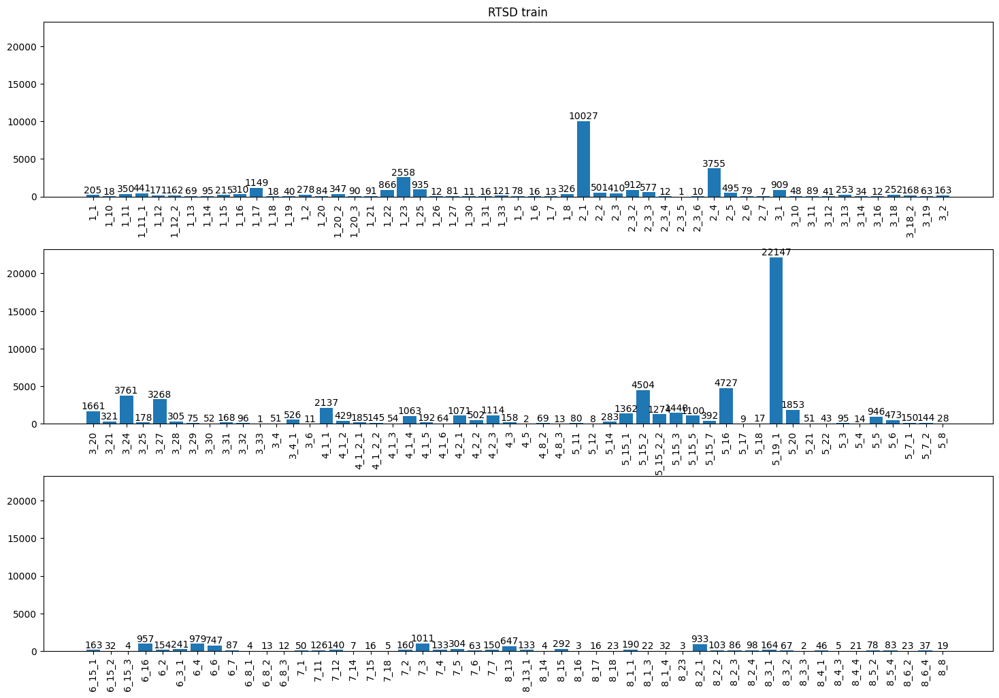

In [34]:
plot1 = train_signs_distribution_df[:53].copy()
plot2 = train_signs_distribution_df[53:105].copy()
plot3 = train_signs_distribution_df[105:].copy()
fig, ax = plt.subplots(nrows=3,ncols=1, sharey=True)
ax1, ax2, ax3 = ax.flatten()
bar1 = ax1.bar(plot1.index, plot1.values)
bar2 = ax2.bar(plot2.index, plot2.values)
bar3 = ax3.bar(plot3.index, plot3.values)
ax1.set_xticks(plot1.index, plot1.index, rotation=90)
ax2.set_xticks(plot2.index, plot2.index, rotation=90)
ax3.set_xticks(plot3.index, plot3.index, rotation=90)
ax1.bar_label(bar1)
ax2.bar_label(bar2)
ax3.bar_label(bar3)
ax1.set_title('RTSD train')
fig.set_size_inches(18,12)
plt.subplots_adjust(hspace=0.3)
plt.show()

Урезанная обучающая выборка

In [18]:
train_reduce_signs_distribution_df = pd.DataFrame(train_anno_reduced.get('annotations'))
train_reduce_signs_distribution_df = train_reduce_signs_distribution_df.merge(pd.DataFrame([label_map]).T.reset_index().set_index(0),
                                                                left_on='category_id', right_index=True)
train_reduce_signs_distribution_df = train_reduce_signs_distribution_df['index'].value_counts().sort_index()
train_reduce_signs_distribution_df.name = 'count'
pd.DataFrame(train_reduce_signs_distribution_df).sort_values('count', ascending=False)

,count
1_1,15
6_15_2,15
5_4,15
5_5,15
5_6,15
...,...
3_2,15
3_20,15
3_21,15
3_24,15


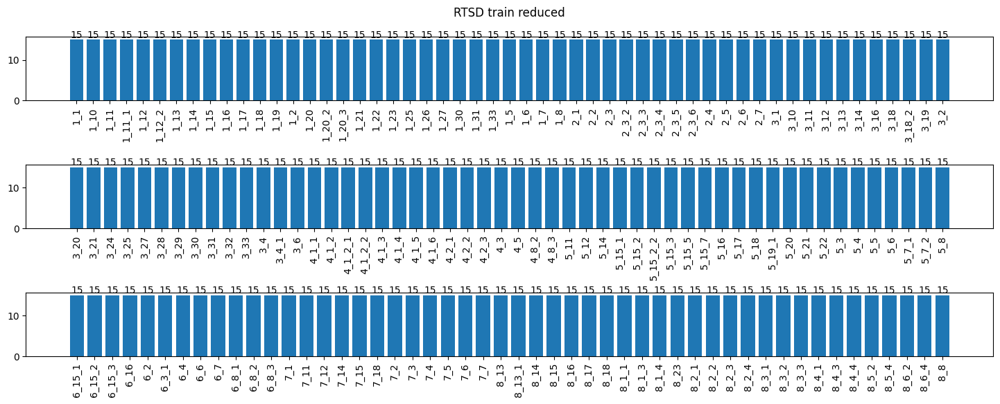

In [35]:
plot1 = train_reduce_signs_distribution_df[:53].copy()
plot2 = train_reduce_signs_distribution_df[53:105].copy()
plot3 = train_reduce_signs_distribution_df[105:].copy()
fig, ax = plt.subplots(nrows=3,ncols=1, sharey=True)
ax1, ax2, ax3 = ax.flatten()
bar1 = ax1.bar(plot1.index, plot1.values)
bar2 = ax2.bar(plot2.index, plot2.values)
bar3 = ax3.bar(plot3.index, plot3.values)
ax1.set_xticks(plot1.index, plot1.index, rotation=90)
ax2.set_xticks(plot2.index, plot2.index, rotation=90)
ax3.set_xticks(plot3.index, plot3.index, rotation=90)
ax1.bar_label(bar1)
ax2.bar_label(bar2)
ax3.bar_label(bar3)
ax1.set_title('RTSD train reduced\n')

fig.set_size_inches(18,6)
plt.subplots_adjust(hspace=1)
plt.show()

Тестовая выборка

In [20]:
val_signs_distribution_df = pd.DataFrame(val_anno.get('annotations'))
val_signs_distribution_df = val_signs_distribution_df.merge(pd.DataFrame([label_map]).T.reset_index().set_index(0),
                                                                left_on='category_id', right_index=True)
val_signs_distribution_df = val_signs_distribution_df['index'].value_counts().sort_index()
val_signs_distribution_df.name = 'count'
pd.DataFrame(val_signs_distribution_df).sort_values('count', ascending=False)

,count
5_19_1,2117
2_1,934
5_16,445
5_15_2,440
3_24,343
...,...
5_12,1
5_17,1
6_8_1,1
2_7,1


In [32]:
plot1 = val_signs_distribution_df[:53].copy()
plot2 = val_signs_distribution_df[53:105].copy()
plot3 = val_signs_distribution_df[105:].copy()
fig, ax = plt.subplots(nrows=3,ncols=1, sharey=True)
ax1, ax2, ax3 = ax.flatten()
bar1 = ax1.bar(plot1.index, plot1.values)
bar2 = ax2.bar(plot2.index, plot2.values)
bar3 = ax3.bar(plot3.index, plot3.values)
ax1.set_xticks(plot1.index, plot1.index, rotation=90)
ax2.set_xticks(plot2.index, plot2.index, rotation=90)
ax3.set_xticks(plot3.index, plot3.index, rotation=90)
ax1.bar_label(bar1)
ax2.bar_label(bar2)
ax3.bar_label(bar3)
ax1.set_title('RTSD val')
fig.set_size_inches(18,12)
plt.subplots_adjust(hspace=0.3)
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_18380\2770617591.py:18: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [64]:
signs_distribution = pd.DataFrame(train_signs_distribution_df).merge(pd.DataFrame(val_signs_distribution_df), left_index=True, right_index=True)
signs_distribution.rename(columns={'count_x': 'Train', 'count_y': 'Val'}, inplace=True)
signs_distribution

,Train,Val
1_1,205,3
1_10,18,4
1_11,350,35
1_11_1,441,36
1_12,171,20
...,...,...
8_5_2,78,3
8_5_4,83,7
8_6_2,23,2
8_6_4,37,5


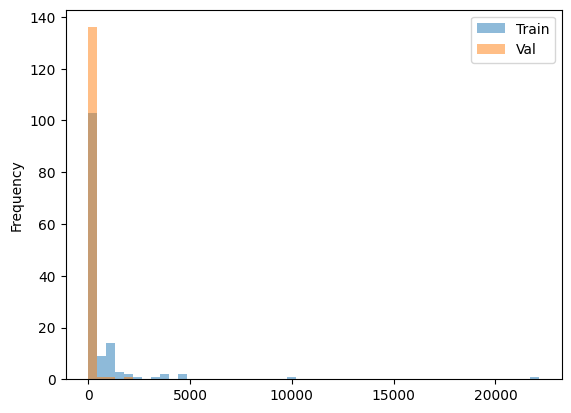

In [76]:
signs_distribution.plot.hist(alpha=0.5, label='Распределение частоты знаков', bins=50);

## Визуализация датасета с помощью библиотеки *pycocotools*

In [10]:
train_anno_file = os.path.join(dataset_path, 'train_anno.json')
train_anno_coco = COCO(train_anno_file)

loading annotations into memory...
Done (t=0.41s)
creating index...
index created!


In [29]:
# получение идентификатора категории
train_anno_coco.getCatIds(['3_4_1'])

[20]

In [30]:
# получение ID изображений, содержащих объект с указанным ID
train_anno_coco.getImgIds(catIds=[20])

[38918,
 38987,
 38988,
 38989,
 16464,
 16465,
 16466,
 16467,
 16468,
 16469,
 16470,
 16471,
 24666,
 101,
 102,
 12392,
 12393,
 12394,
 12395,
 12396,
 12397,
 12398,
 12411,
 12412,
 12413,
 12414,
 12417,
 12418,
 12419,
 12420,
 159,
 160,
 24765,
 24766,
 24767,
 24769,
 24770,
 24771,
 39118,
 39119,
 39120,
 39122,
 26861,
 26862,
 26863,
 26864,
 26865,
 26866,
 26867,
 26868,
 26869,
 26870,
 26871,
 35065,
 35066,
 35067,
 35068,
 35069,
 35070,
 35071,
 35072,
 35073,
 35074,
 35075,
 35076,
 26899,
 26900,
 26901,
 26902,
 26903,
 26904,
 26905,
 26906,
 26908,
 26909,
 26910,
 31039,
 31040,
 31041,
 31042,
 31044,
 31045,
 31046,
 31047,
 31048,
 24985,
 24986,
 34274,
 34275,
 34276,
 34277,
 34278,
 34279,
 34280,
 25021,
 25022,
 25023,
 25024,
 25026,
 25028,
 25029,
 25031,
 25032,
 25033,
 25034,
 30214,
 30215,
 29168,
 29169,
 29170,
 32259,
 32260,
 32261,
 523,
 32262,
 51756,
 51757,
 51758,
 51759,
 51760,
 51761,
 51762,
 33331,
 33332,
 33333,
 33334,
 3

In [91]:
# получение ID аннотации для указанного ID изображения
annotation_ids = train_anno_coco.getAnnIds(imgIds=10801)
annotation_ids

[17829]

In [92]:
# получение ID аннотации для указанных ID изображения и ID категории
annotation_ids = train_anno_coco.getAnnIds(imgIds=10801, catIds=[123])
annotation_ids

[17829]

In [96]:
train_anno_coco.anns[17829]

{'id': 17829,
 'image_id': 10801,
 'category_id': 123,
 'area': 702,
 'bbox': [998, 302, 26, 27],
 'iscrowd': 0}

In [14]:
def pycocotools_visualizer(image_id, category_id = None):
    '''функция по выводу изображения с указанным ID
    и визуализацией аннотаций с выбранными ID категорий (список)
    Если ID категорий не указаны - выводятся все аннотации для изображения'''
    if category_id:
        annotation_ids = train_anno_coco.getAnnIds(imgIds=image_id, catIds=category_id)
    else:
        annotation_ids = train_anno_coco.getAnnIds(imgIds=image_id)
            
    # загрузка аннотаций в список
    anns = train_anno_coco.loadAnns(annotation_ids)

    # путь к изображению и его название
    images_path = dataset_path
    image_name = train_anno_coco.loadImgs(image_id)[0].get('file_name')
    image = Image.open(os.path.join(images_path, image_name))
    
    fig, ax = plt.subplots()
    fig.set_size_inches(18, 10)
    
    # Draw boxes and add label to each box
    for ann in anns:
        box = ann['bbox']
        bb = patches.Rectangle((box[0],box[1]), box[2],box[3], linewidth=1, edgecolor="yellow", facecolor="none")
        ax.add_patch(bb)
    
    ax.imshow(image)
    plt.show()

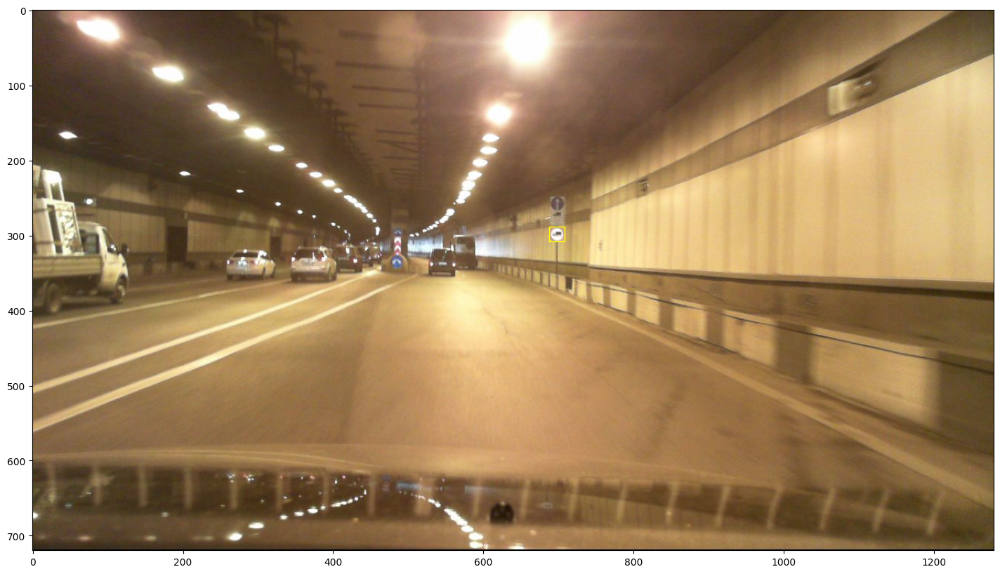

In [40]:
pycocotools_visualizer(4085, [20])

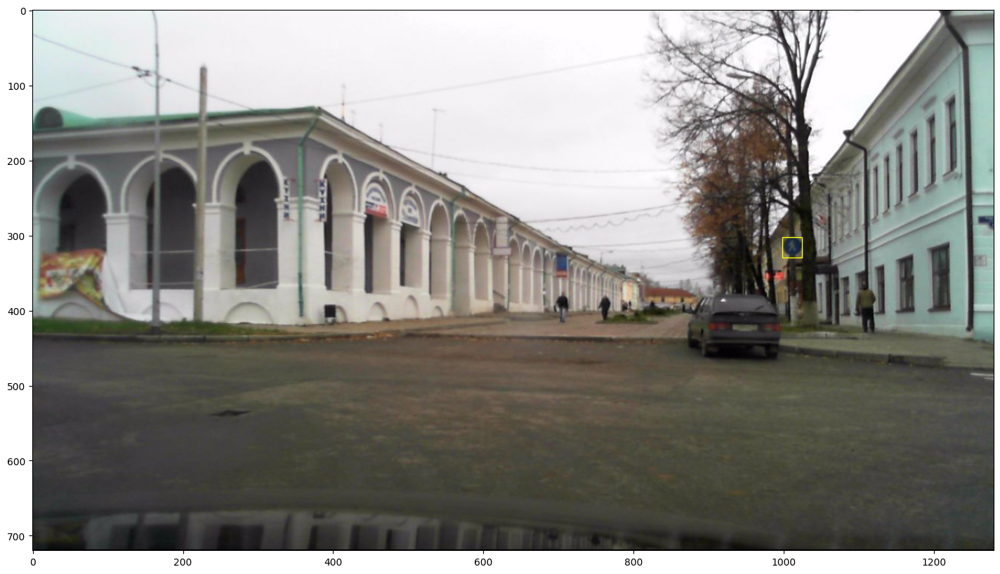

In [114]:
pycocotools_visualizer(10801, [123])

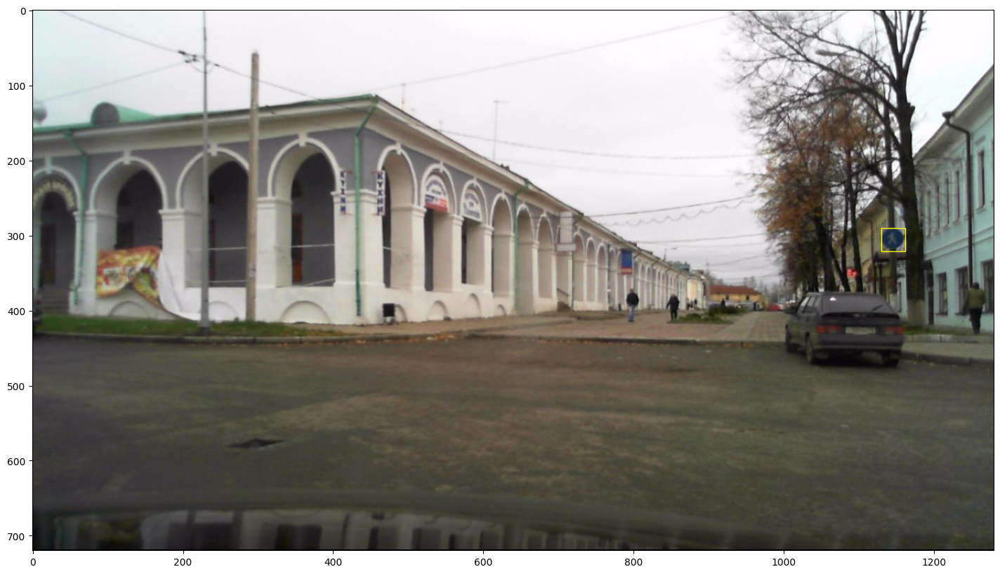

In [99]:
pycocotools_visualizer(10802)

## Визуализация датасета с помощью библиотеки *fiftyone*

In [23]:
# загрузка датасета

# The directiry containing the source images
data_path = dataset_path      # можно не указывать, если в JSON путь совпадает

# The path yo the COCO labels JSON file
labels_file = "train_anno.json"
labels_path = os.path.join(dataset_path, labels_file)


# Import the dataset
dataset = fo.Dataset.from_dir(
    dataset_type=fo.types.COCODetectionDataset,
    data_path=data_path,
    labels_path=labels_path
)

 100% |█████████████| 54188/54188 [1.5m elapsed, 0s remaining, 651.8 samples/s]      


In [24]:
dataset

Name:        2023.01.29.17.02.13
Media type:  image
Num samples: 54188
Persistent:  False
Tags:        []
Sample fields:
    id:         fiftyone.core.fields.ObjectIdField
    filepath:   fiftyone.core.fields.StringField
    tags:       fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:   fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    detections: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)

In [28]:
# Визуализация набора данных
session = fo.launch_app(dataset)

In [ ]:
# Использование агрегатов с помощью API для получения статистики о наборе данных
# Количество обнаружений для каждой категории
dataset.count_values("detections.detections.label")

{'6_16': 957,
 '8_8': 19,
 '3_11': 89,
 '5_15_3': 1448,
 '1_27': 81,
 '6_4': 979,
 '3_25': 178,
 '1_12_2': 162,
 '1_13': 69,
 '8_1_4': 32,
 '5_15_2': 4504,
 '3_13': 253,
 '8_2_2': 103,
 '8_4_1': 46,
 '6_15_1': 163,
 '1_20_3': 90,
 '8_13': 647,
 '5_12': 8,
 '3_6': 11,
 '5_6': 473,
 '5_22': 43,
 '1_26': 12,
 '5_17': 9,
 '3_18_2': 168,
 '4_2_1': 1071,
 '3_20': 1661,
 '2_3_3': 577,
 '1_20_2': 347,
 '1_2': 278,
 '5_18': 17,
 '6_6': 747,
 '1_14': 95,
 '2_6': 79,
 '8_13_1': 133,
 '1_1': 205,
 '8_6_4': 37,
 '3_2': 163,
 '4_5': 2,
 '3_33': 1,
 '8_4_3': 5,
 '3_4': 51,
 '3_18': 252,
 '5_15_2_2': 1274,
 '3_1': 909,
 '2_3_6': 10,
 '3_31': 168,
 '7_7': 150,
 '2_3_2': 912,
 '8_3_3': 2,
 '8_16': 3,
 '5_14': 283,
 '5_21': 51,
 '8_15': 292,
 '7_11': 126,
 '1_30': 11,
 '8_3_1': 164,
 '1_20': 84,
 '3_14': 34,
 '5_4': 14,
 '4_8_3': 13,
 '8_2_3': 86,
 '3_4_1': 526,
 '1_11_1': 441,
 '4_2_2': 502,
 '5_19_1': 22147,
 '3_24': 3761,
 '3_28': 305,
 '8_23': 3,
 '8_4_4': 21,
 '4_1_6': 64,
 '5_7_1': 150,
 '1_18': 18


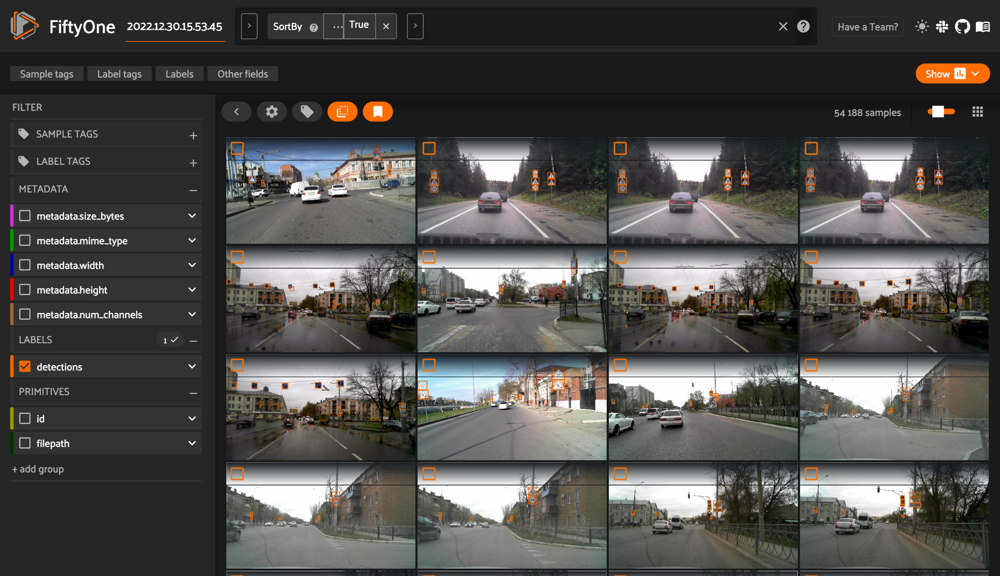

In [ ]:
# взаимодействие с набором данных через представление
# сортировка по выборкам с наибольшим количеством объектов
from fiftyone import ViewField as F

# Sort samples with the most objects first
obj_count_view = dataset.sort_by(F("detections.detections").length(), reverse=True)
session.view = obj_count_view


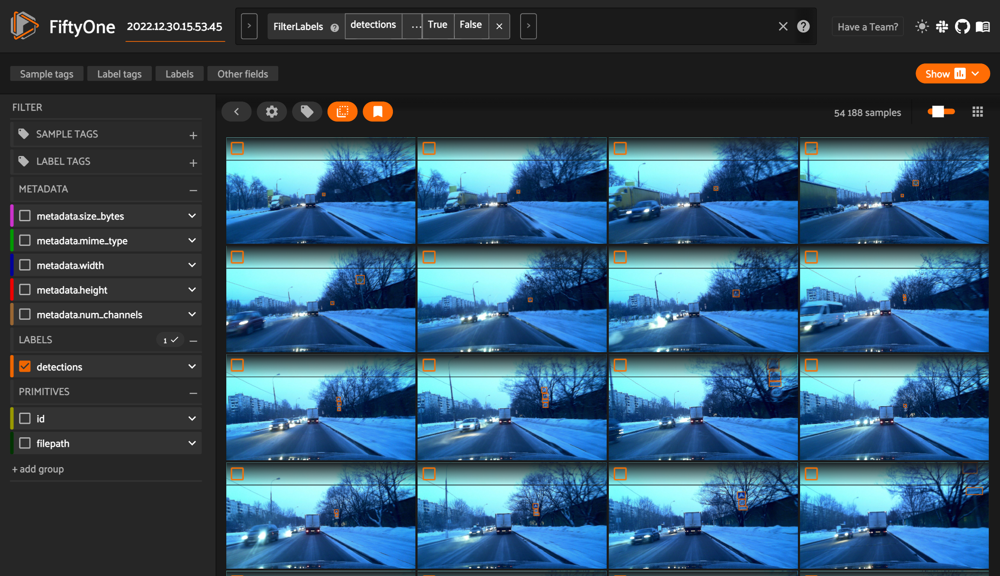

In [ ]:
# представление, которое фильтрует поле метки на основе более сложного значения, такого как небольшая область ограничивающей рамки

# Filter to only view small objects
# Bboxes are in [top-left-x, top-left-y, width, height] format
bbox_area = F("bounding_box")[2] * F("bounding_box")[3]

small_obj_view = dataset.filter_labels("detections",
                                       bbox_area < 0.5,
                                       )
session.view = small_obj_view

In [ ]:
# FiftyOne Brain содержит различные методы, позволяющие анализировать качество ваших достоверных данных.
# Например, можно найти самые уникальные образцы в своем наборе данных, которые помогут лучше понять,
# какие дополнительные данные вам следует добавить
import fiftyone.brain as fob
fob.compute_uniqueness(dataset)

 100% |████|  100.6Mb/100.6Mb [58.7s elapsed, 0s remaining, 2.1Mb/s]       
Computing embeddings...
 100% |█████████████| 54188/54188 [18.8m elapsed, 0s remaining, 48.7 samples/s]      
Computing uniqueness...
Computing neighbors for 54188 embeddings; this may take awhile...
Uniqueness computation complete



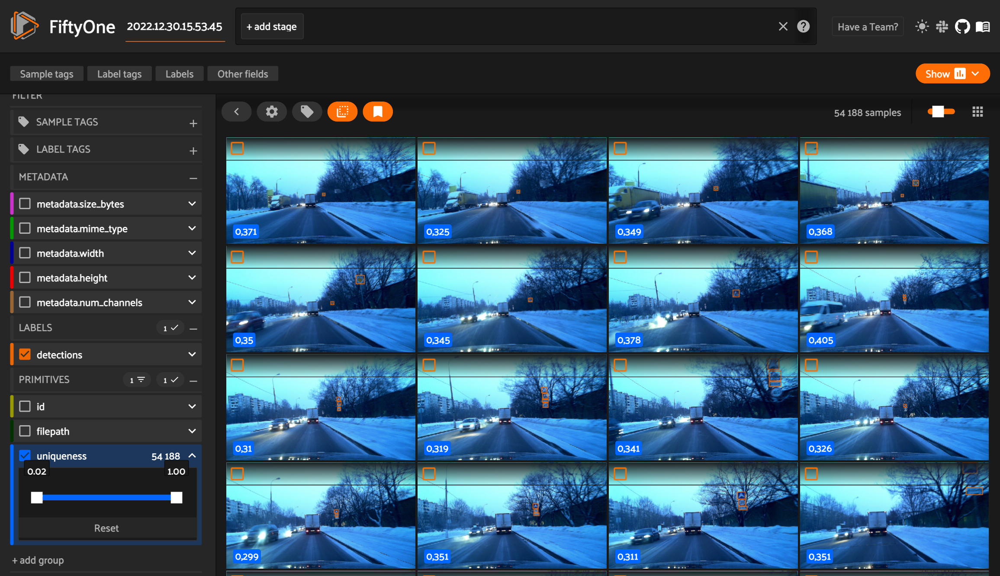


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds



In [ ]:
session = fo.launch_app(dataset)

In [ ]:
fo.config.requirement_error_level=1

In [ ]:
fiftyone.config.requirement_error_level

In [ ]:
fo.zoo.models.install_zoo_model_requirements("ssd-mobilenet-v1-fpn-coco-tf", error_level=None)

In [ ]:
!pip install fiftyone zoo models list

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [8 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/private/var/folders/gh/31h0x0ms74xf16jg_0_6x8940000gn/T/pip-install-njgyctz9/models_d1a670afbba142a08c4364443da65154/setup.py", line 25, in <module>
          import models
        File "/private/var/folders/gh/31h0x0ms74xf16jg_0_6x8940000gn/T/pip-install-njgyctz9/models_d1a670afbba142a08c4364443da65154/models/__init__.py", line 23, in <module>
          from base import *
      ModuleNotFoundError: No module named 'base'
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

× Encountered error while generating packag

In [ ]:
!eta install models

Cloning https://github.com/voxel51/models
Клонирование в «/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/tensorflow/models»...
remote: Enumerating objects: 30876, done.
^Cлучение объектов:  16% (4964/30876), 19.80 МиБ | 216.00 КиБ/с
fetch-pack: unexpected disconnect while reading sideband packet
Traceback (most recent call last):
  File "/opt/anaconda3/envs/ds_env/bin/eta", line 8, in <module>
    sys.exit(main())
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 4262, in main
    args.execute(args)
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 4245, in <lambda>
    parser.set_defaults(execute=lambda args: command.execute(parser, args))
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 176, in execute
    _run_install_script(name, _INSTALL_SCRIPTS)
  File "/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/eta/core/cli.py", line 181, in _run_install_scrip

In [ ]:
# генерация прогнозов на предварительно обученных моделях с помощью FiftyOne Model Zoo
#import fiftyone as fo
import fiftyone.zoo as foz
#from object_detection.utils import label_map_util

# Load COCO dataset from disk
#dataset = fo.Dataset(
#    "/path/to/dataset_dir", 
#    dataset_type=fo.types.COCODetectionDataset, 
#    name="my_dataset"
#)

# Load a model and generate predictions
model = foz.load_zoo_model("ssd-mobilenet-v1-fpn-coco-tf", install_requirements=True)
dataset.apply_model(model, label_field="predictions")

# Launch the FiftyOne App to view dataset
session = fo.launch_app(dataset)

ImportError: You must run `eta install models` in order to use this model

In [ ]:
# Предсказание на предобученной моделе
import fiftyone as fo
import fiftyone.zoo as foz

# List available zoo models
model_names = foz.list_zoo_models()
print(model_names)

#
# Load zoo model
#
# This will download the model from the web, if necessary, and ensure
# that any required packages are installed
#
model = foz.load_zoo_model("faster-rcnn-resnet50-fpn-coco-torch")

#
# Load some samples from the COCO-2017 validation split
#
# This will download the dataset from the web, if necessary
#
#dataset = foz.load_zoo_dataset(
#    "coco-2017",
#    split="validation",
#    dataset_name="coco-2017-validation-sample",
#    max_samples=50,
#    shuffle=True,
#)

#
# Choose some samples to process. This can be the entire dataset, or a
# subset of the dataset. In this case, we'll choose some samples at
# random
#
samples = dataset.take(25)

#
# Generate predictions for each sample and store the results in the
# `faster_rcnn` field of the dataset, discarding all predictions with
# confidence below 0.5
#
samples.apply_model(model, label_field="faster_rcnn", confidence_thresh=0.5)
print(samples)

# Visualize predictions in the App
session = fo.launch_app(view=samples)

['alexnet-imagenet-torch', 'centernet-hg104-1024-coco-tf2', 'centernet-hg104-512-coco-tf2', 'centernet-mobilenet-v2-fpn-512-coco-tf2', 'centernet-resnet101-v1-fpn-512-coco-tf2', 'centernet-resnet50-v1-fpn-512-coco-tf2', 'centernet-resnet50-v2-512-coco-tf2', 'clip-vit-base32-torch', 'deeplabv3-cityscapes-tf', 'deeplabv3-mnv2-cityscapes-tf', 'deeplabv3-resnet101-coco-torch', 'deeplabv3-resnet50-coco-torch', 'densenet121-imagenet-torch', 'densenet161-imagenet-torch', 'densenet169-imagenet-torch', 'densenet201-imagenet-torch', 'efficientdet-d0-512-coco-tf2', 'efficientdet-d0-coco-tf1', 'efficientdet-d1-640-coco-tf2', 'efficientdet-d1-coco-tf1', 'efficientdet-d2-768-coco-tf2', 'efficientdet-d2-coco-tf1', 'efficientdet-d3-896-coco-tf2', 'efficientdet-d3-coco-tf1', 'efficientdet-d4-1024-coco-tf2', 'efficientdet-d4-coco-tf1', 'efficientdet-d5-1280-coco-tf2', 'efficientdet-d5-coco-tf1', 'efficientdet-d6-1280-coco-tf2', 'efficientdet-d6-coco-tf1', 'efficientdet-d7-1536-coco-tf2', 'faster-rcnn-in

/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/ds_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /Users/denis/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

 100% |███████████████████| 25/25 [1.6m elapsed, 0s remaining, 0.2 samples/s]     
Dataset:     2022.12.30.15.53.45
Media type:  image
Num samples: 25
Sample fields:
    id:          fiftyone.core.fields.ObjectIdField
    filepath:    fiftyone.core.fields.StringField
    tags:        fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:    fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    detections:  fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    uniqueness:  fiftyone.core.fields.FloatField
    faster_rcnn: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
View stages:
    1. Take(size=25, seed=None)



Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds



In [ ]:
# Оценка модели mAP (средняя средняя точность)
# При оценке модели обнаружения объектов категории прогнозов должны совпадать с категориями набора данных
import fiftyone as fo

# Load a FiftyOne dataset you previously created
#dataset = fo.load_dataset("my_dataset")

results = dataset.evaluate_detections(
    pred_field="faster_rcnn", # predictions
    gt_field="detections",
    eval_key="eval_coco",
    compute_mAP=True,
)

print(results.mAP())

Evaluating detections...
 100% |█████████████| 54188/54188 [1.5m elapsed, 0s remaining, 703.8 samples/s]      
Performing IoU sweep...
 100% |█████████████| 54188/54188 [1.2m elapsed, 0s remaining, 848.8 samples/s]      
0.0


In [ ]:
from fiftyone import ViewField as F

high_conf_fp_view = dataset.filter_labels(
    "predictions", 
    (F("eval_coco")=="fp") & (F("confidence") > 0.7)
)

session.view = high_conf_fp_view